# Mode-Turbulence Coupling: Numerical Analysis
# 2 Runs:
# 1. Normal Run
# 2. Keep delta_tau & F2 same, but set F1= 0

In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

import random
import matplotlib.pyplot as plt
import numpy as np
import math
import scipy.interpolate as interpolate

## Physical Parameters

In [2]:
# mach number Ma
Ma = 0.3
K = 1
eta = 1

## Functions of Ma

In [3]:
meandeltaT = 2*np.pi

# variables for generating F1
meanF1 = 0
stdF1 = eta * Ma**2 / (2 * np.pi)
limitY1 = eta / (2 * np.pi)

# variables for generating F2
meanF2 = 0
stdF2 = eta * Ma**2
limitY2 = eta 

## Calculation parameters

In [4]:
L = 10
M = 100
N = 1

# dTau is the time step for the Runge Kutta Method
dTau = 2*np.pi/100
Tr = K * meandeltaT

## Calculation relations

In [5]:
 Tmax = 2 * np.pi * M
# delt = N * deltaT

## Initial Conditions

In [6]:
# initial conditions A(0)=1/2*std_F2, dA/dT(0)=0
initial_dAdT = 0
initial_AT = 0

In [7]:
n_bins = 200

axis_font = {'size':'30'}
title_font = {'size':'40'}

## Functions

In [8]:
# Source: https://docs.scipy.org/doc/numpy-1.15.0/reference/generated/numpy.random.rayleigh.html
#deltaT is the length of each eddy turnover
def fundeltaT(n_bins, M):
    deltaT = []
    rayleigh = np.random.rayleigh(meandeltaT, M)                           
    hist, bin_edges = np.histogram(rayleigh, bins=n_bins, density=True)
    cum_values = np.zeros(bin_edges.shape)
    cum_values[1:] = np.cumsum(hist*np.diff(bin_edges))
    inv_cdf = interpolate.interp1d(cum_values, bin_edges)
    # ensure that deltaT is a multiple of dTau
    for i in range(M):
        r = np.random.rand(1)
        deltaTtemp = inv_cdf(r)
        if (deltaTtemp % dTau < 0.005):
            deltaTtemp2 = deltaTtemp - (deltaTtemp % dTau)
        else:
            deltaTtemp2 = deltaTtemp + dTau - (deltaTtemp % dTau)
        deltaT.append(deltaTtemp2)
    count, bins, ignored = plt.hist(rayleigh, 80, density=True)
    plt.title("Rayleigh Distribution")
    plt.xlabel("Delta T")
    plt.show()
    return deltaT




# Tturb adds up the delta T's
def funTturb():
    Tturb=[0]
    for i in range(len(deltaT)-1):
        Tturb.append(deltaT[i]+Tturb[i])
    time=Tturb
    time.pop(-1)
    return Tturb, time




def funF1():
    time = []
    y1 = 0
    F1 = []
    for i in range(len(deltaT) - 1):
        Tn = ((deltaT[i] + deltaT[i+1]) / 2)
        stdevt = ((1 - math.exp(-2 * Tn / Tr)) * stdF1 ** 2) ** (1/2)
        meant = math.exp(-Tn / Tr) * y1
        # y1 is chosen from markov conditional probability function
        # put limit on y1
            # set y1 > limitY1 so that while loop only ends when y1 < limitY1
        y1 = limitY1 + 1
        while abs(y1) > limitY1:
            y1 = np.random.normal(meant, stdevt, 2)[0]
        Ttemp = np.linspace(0, deltaT[i], deltaT[i] / dTau)
        # loops through each eddy
        for j in Ttemp:
            x = j / deltaT[i][0]
            if j == deltaT[i]:
                pass
            else:
                time.append(j+Tturb[i])
                F1.append(16 * y1 * x**2 * (1 - x)**2)
    return F1, time
    
    
    
    
def funF2():
    time = []
    y2 = 0
    F2 = []
    for i in range(len(deltaT) - 1):
        Tn = ((deltaT[i] + deltaT[i+1]) / 2)
        stdevt = ((1 - math.exp(-2 * Tn / Tr)) * stdF2 ** 2) ** (1/2)
        meant = math.exp(-Tn / Tr) * y2
        # y2 is chosen from markov conditional probability function
        # put limit on y2
        y2 = limitY2 + 1
        while abs(y2) > limitY2:
            y2 = np.random.normal(meant, stdevt, 2)[0]
        Ttemp = np.linspace(0, deltaT[i], deltaT[i] / dTau)
        # loops through each eddy
        for j in Ttemp:
            x = j / deltaT[i][0]
            if j == deltaT[i]:
                pass
            else:
                time.append(j+Tturb[i])
                F2.append(16 * y2 * x**2 * (1 - x)**2)
    return F2, time




# set G1 = 0
def funG1(F1):
    G1=[]
    for i in range(len(F1)):
        G1.append(0)
    return G1




def funAmp(Amp, F1, time):
    # Runge Kutta

    # A'' = f(T, A, A') = -F1 * A' - A + F2
    # A' = u
    # u' = f(T, A, u) = -F1 * u - A + F2
    # A'(0) = 0

    t = 0.0
    A = Amp[0]
    u = 0
    
    for i in range(len(time)):
        m1 = u
        k1 = -(F1[i] * u) - A + F2[i]
        m2 = u + (dTau / 2.) * k1
        t_2 = t + (dTau / 2)
        A_2 = A + (dTau / 2) * m1
        u_2 = m2
        k2 = -(F1[i] * u_2) - A_2 + F2[i]
        m3 = u + (dTau / 2) * k2
        t_3 = t + (dTau / 2)
        A_3 = A + (dTau / 2) * m2
        u_3 = m3
        k3 = -(F1[i] * u_3) - A_3 + F2[i]
        m4 = u + dTau *k3
        t_4 = t + dTau
        A_4 = A + dTau * m3
        u_4 = m4
        k4 = -(F1[i] * u_4) - A_4 + F2[i]
        t = t + dTau 
        A = A + (dTau / 6.) * (m1 + (2. * m2) + (2. * m3) + m4)
        u = u + (dTau / 6.) * (k1 + (2. * k2) + (2. * k3) + k4)
        Amp.append(A)

    Amp = Amp[:-1]
    
    return Amp





# Average value of Amplitude
def FunAsqr(A):
    Asqr = []
    for i in A:
        Asqr.append(i**2)
    return Asqr




# log(A)
def FunLog(A):
    logA = []
    for i in A:
        logA.append(math.log10(abs(i)))
    return logA




# Root mean square
def FunRMS(A):
    Asqr = []
    for i in A:
        Asqr.append(i**2)
    avg = np.sum(Asqr) / len(Asqr)
    RMS = avg**(1/2)
    return RMS


# flattens nested arrays into one dimensional arrays
def flatten(input):
    new_list = []
    for i in input:
        for j in i:
            new_list.append(j)
    return new_list 

# Run #1: Normal Run

##  F1, Amplitude of mode, F2 vs. Time for all runs

### Evolution 1

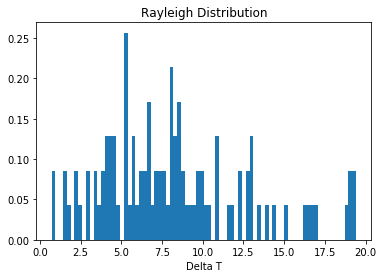

In [9]:
deltaT = fundeltaT(n_bins, M)

Tturb, time = funTturb()

1st Run: Normal


/Users/celiatandon/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:54: DeprecationWarning: object of type <class 'numpy.ndarray'> cannot be safely interpreted as an integer.


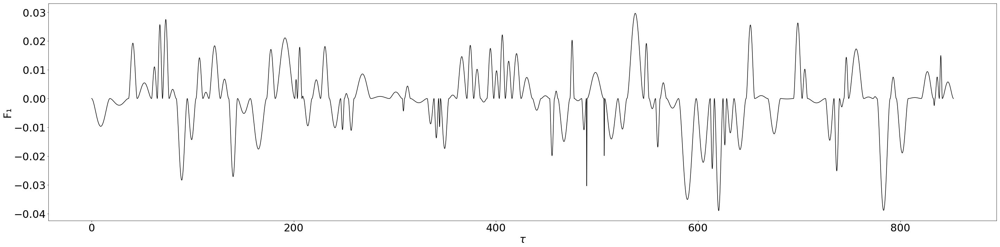

/Users/celiatandon/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:81: DeprecationWarning: object of type <class 'numpy.ndarray'> cannot be safely interpreted as an integer.


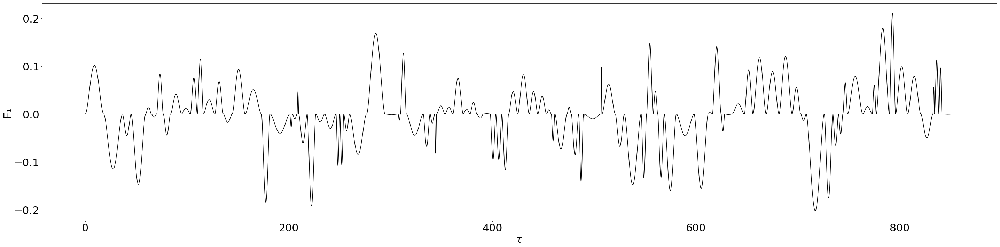

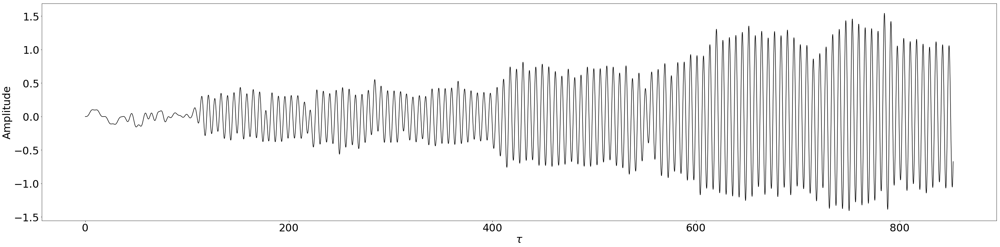

2nd Run: F1 = 0


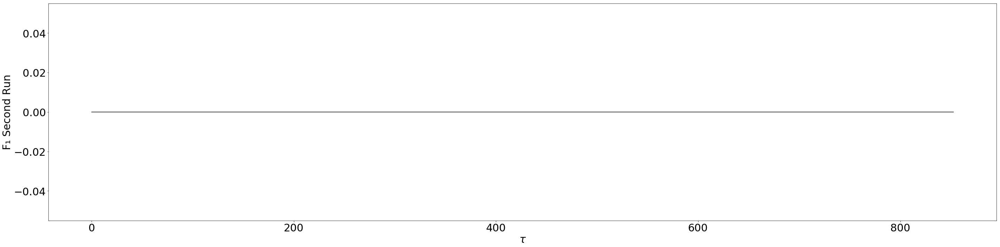

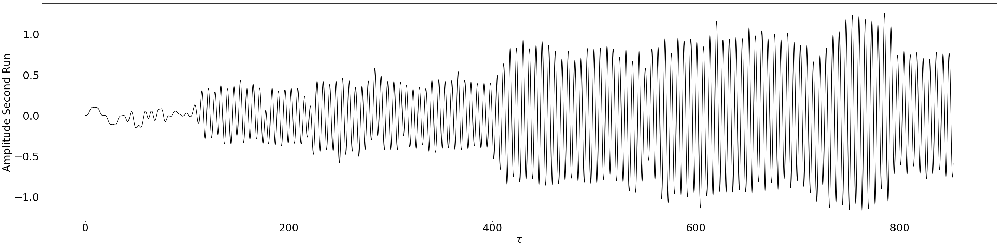

Difference in amplitude of run 1 and 2


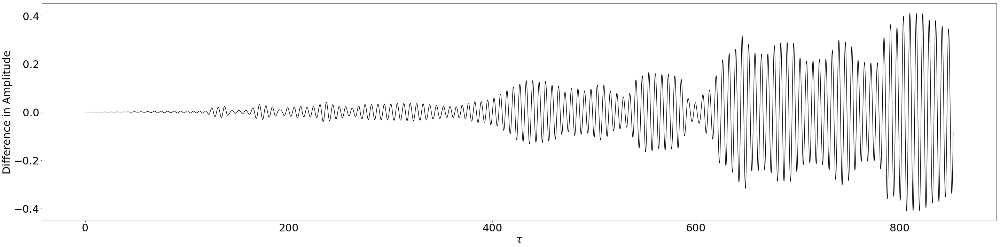

In [10]:
# total amp will contain the amplitudes of every run
total_Amp=[]
total_Amp_2ndRun=[]

print("1st Run: Normal")

# generate F1

F1, time =funF1()

plt.figure(figsize=(40,10))    
plt.plot(time, F1, 'k')
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.xlabel(r'$\tau$', **axis_font)
plt.ylabel('F\u2081', **axis_font)
plt.tight_layout()
plt.show()
    
# generate F2

F2, time = funF2()

plt.figure(figsize=(40,10))    
plt.plot(time, F2, 'k')
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.xlabel(r'$\tau$', **axis_font)
plt.ylabel('F\u2081', **axis_font)
plt.tight_layout()
plt.show()

# generate G1

G1 = funG1(F1)

# generate Amp

Amp = [initial_AT]
 
Amp = funAmp(Amp, F1, time)

plt.figure(figsize=(40,10))
plt.plot(time, Amp, 'k')
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.xlabel(r'$\tau$', **axis_font)
plt.ylabel('Amplitude', **axis_font)
plt.tight_layout()
plt.show()

total_Amp.append(Amp)

# generate F1 and Amp for second run 

print("2nd Run: F1 = 0")

F1_2ndRun = funG1(F1)

plt.figure(figsize=(40,10))    
plt.plot(time, F1_2ndRun, 'k')
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.xlabel(r'$\tau$', **axis_font)
plt.ylabel('F\u2081 Second Run', **axis_font)
plt.tight_layout()
plt.show()

Amp_2ndRun = [initial_AT]

Amp_2ndRun = funAmp(Amp_2ndRun, F1_2ndRun, time)

plt.figure(figsize=(40,10))
plt.plot(time, Amp_2ndRun, 'k')
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.xlabel(r'$\tau$', **axis_font)
plt.ylabel('Amplitude Second Run', **axis_font)
plt.tight_layout()
plt.show()

total_Amp_2ndRun.append(Amp_2ndRun)

print("Difference in amplitude of run 1 and 2")

# find difference in amplitude between each run
Amp_difference = []

for i in range(len(Amp)):
    Amp_difference.append(Amp[i] - Amp_2ndRun[i])

plt.figure(figsize=(40,10))
plt.plot(time, Amp_difference, 'k')
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.xlabel(r'$\tau$', **axis_font)
plt.ylabel('Difference in Amplitude', **axis_font)
plt.tight_layout()
plt.show()

### Evolutions 2 - L

evolution 1 above


evolution  2


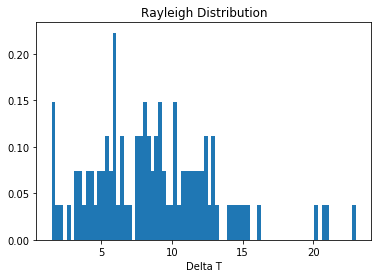

/Users/celiatandon/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:81: DeprecationWarning: object of type <class 'numpy.ndarray'> cannot be safely interpreted as an integer.
/Users/celiatandon/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:54: DeprecationWarning: object of type <class 'numpy.ndarray'> cannot be safely interpreted as an integer.


1st Run: Normal


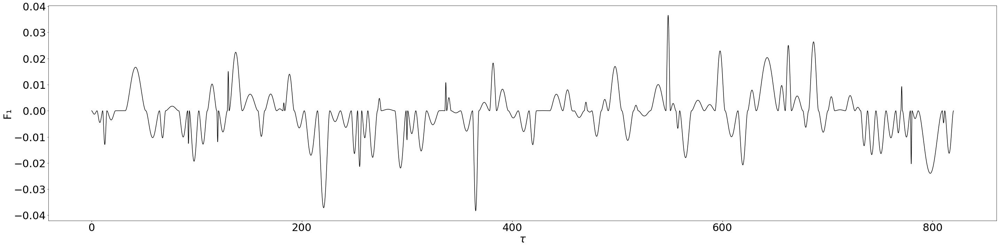

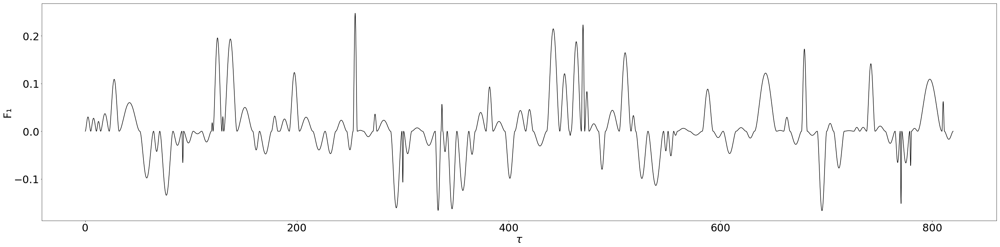

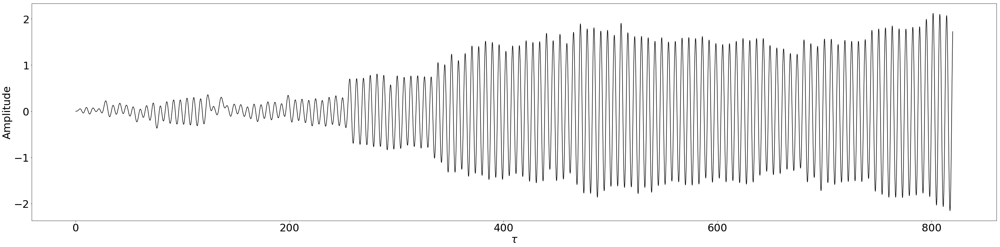

2nd Run: F1 = 0


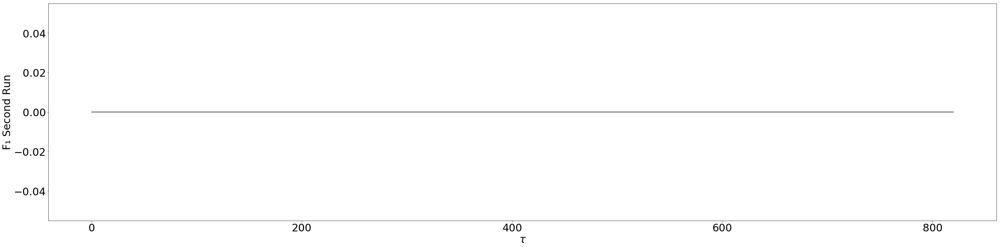

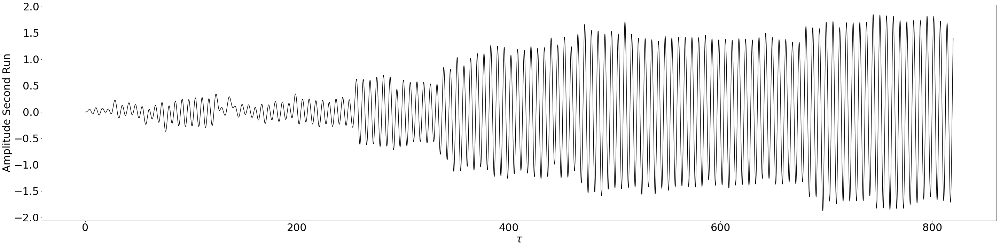

Difference in amplitude of run 1 and 2


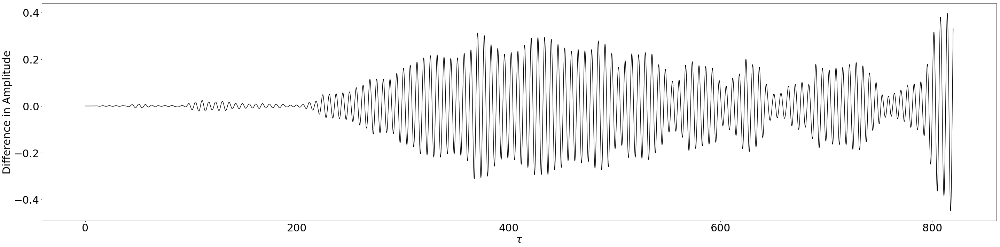



evolution  3


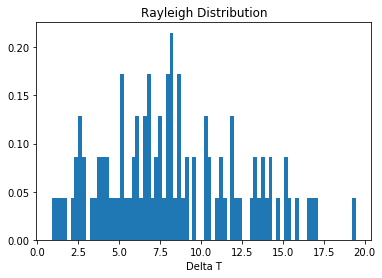

1st Run: Normal


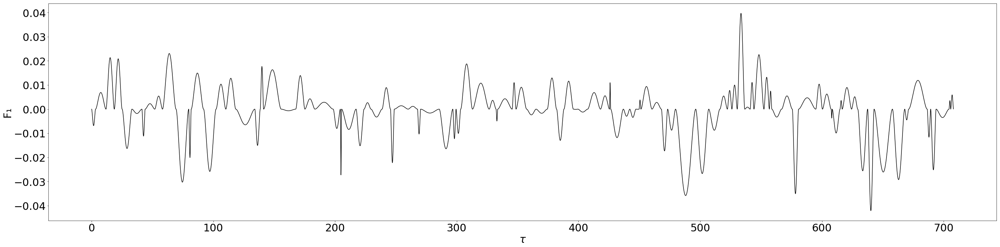

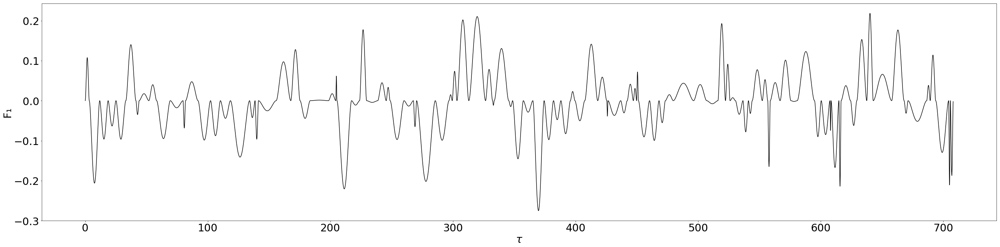

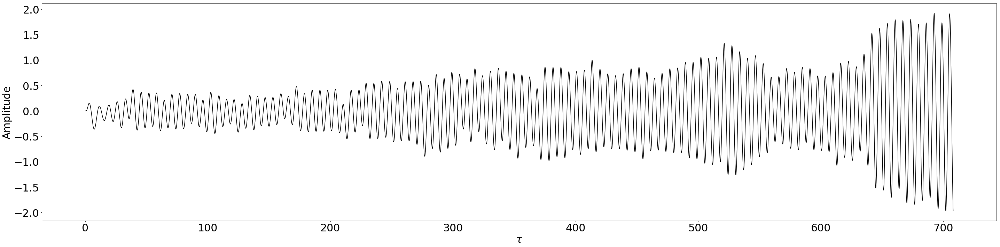

2nd Run: F1 = 0


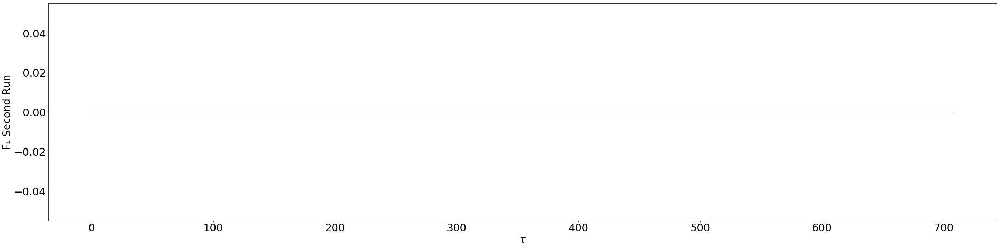

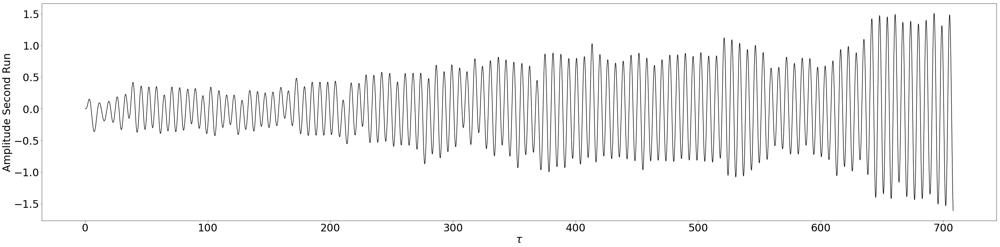

Difference in amplitude of run 1 and 2


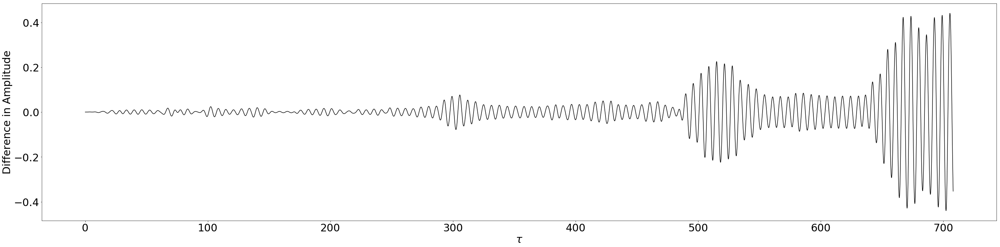



evolution  4


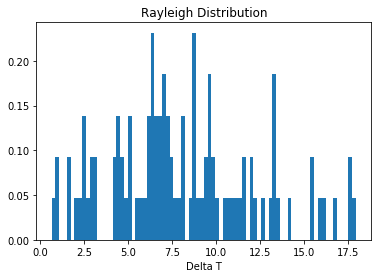

1st Run: Normal


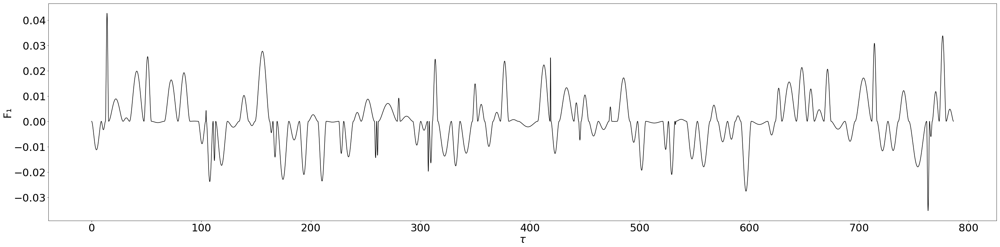

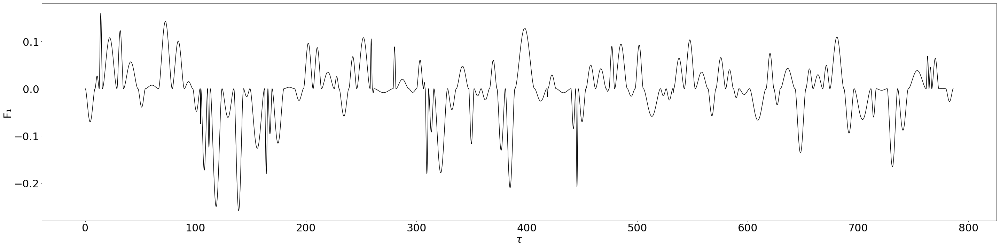

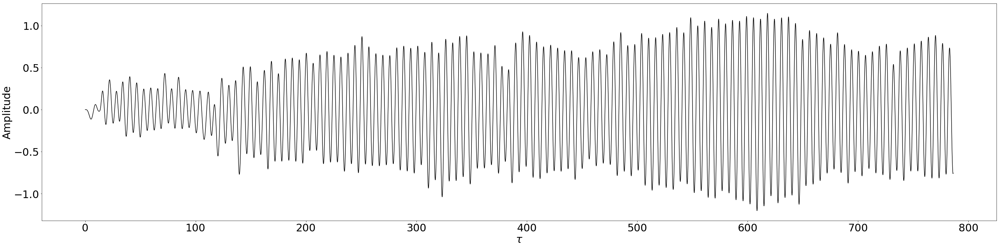

2nd Run: F1 = 0


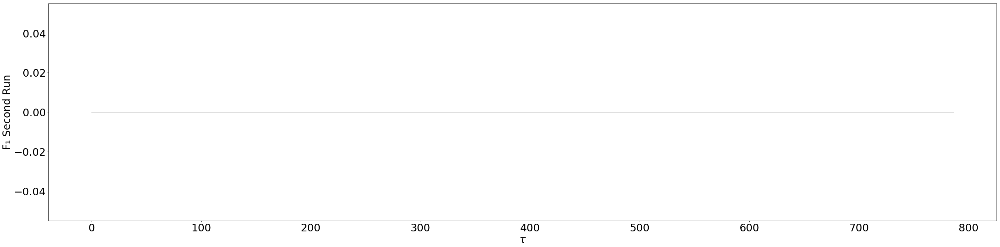

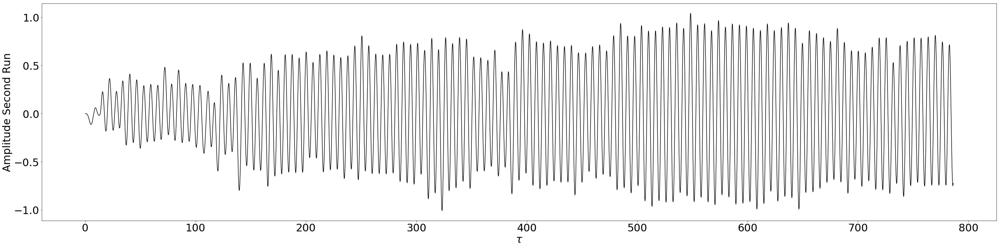

Difference in amplitude of run 1 and 2


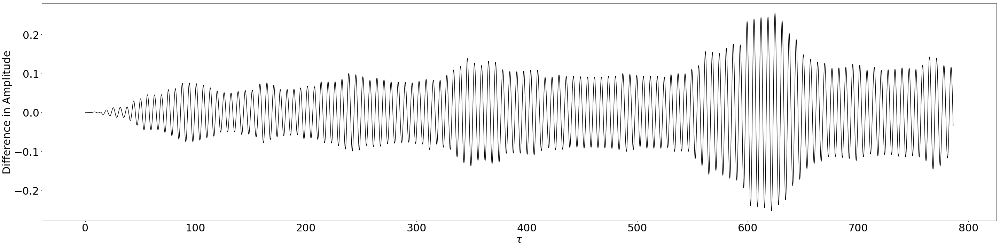



evolution  5


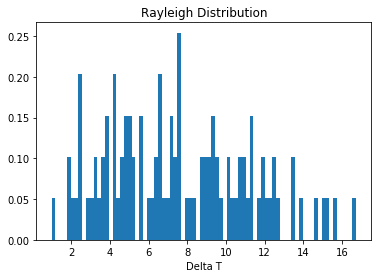

1st Run: Normal


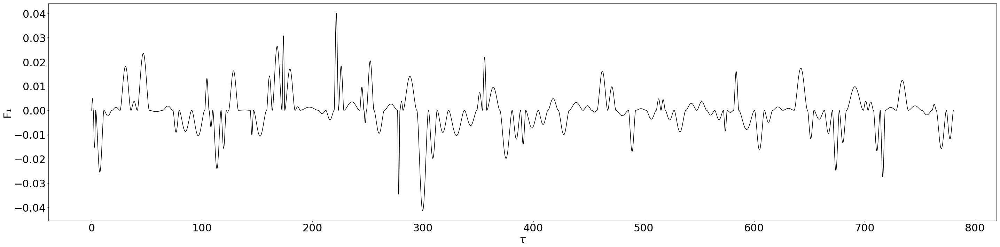

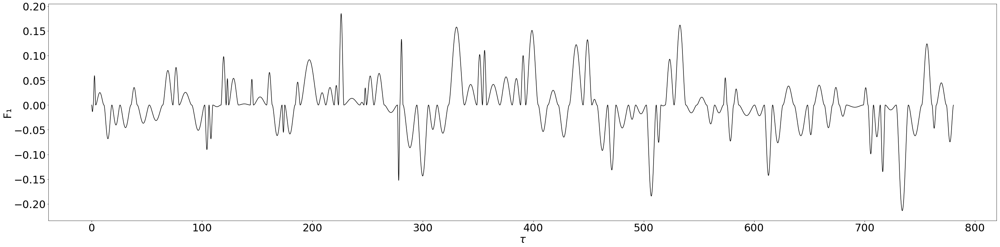

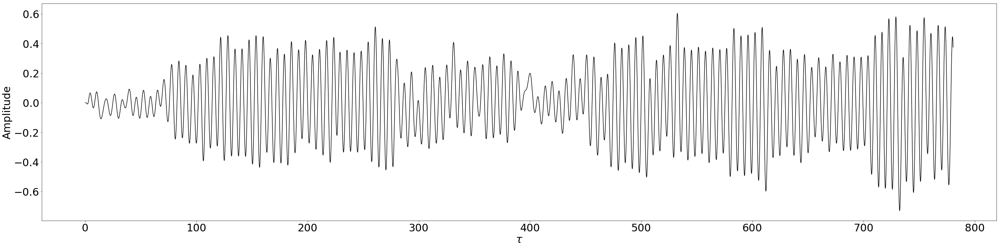

2nd Run: F1 = 0


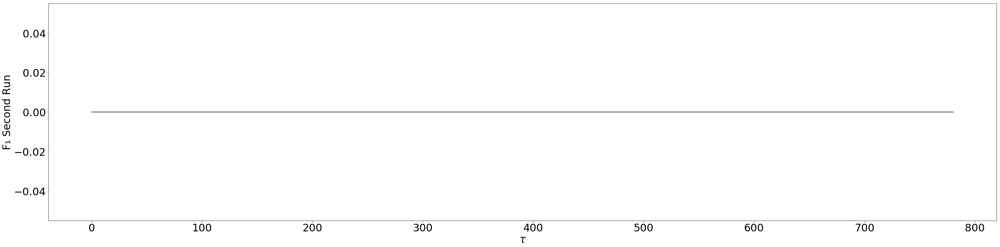

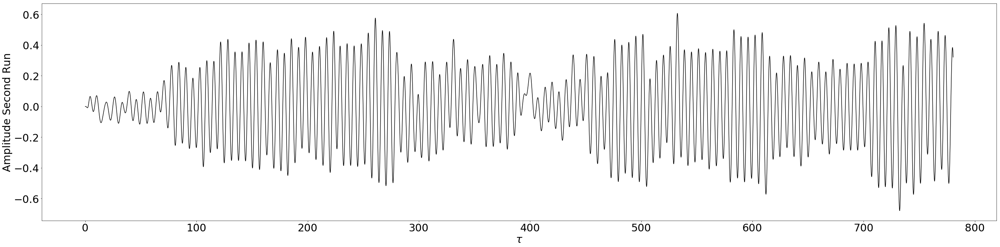

Difference in amplitude of run 1 and 2


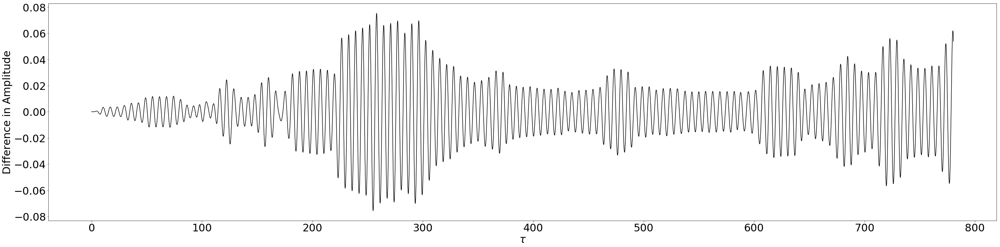



evolution  6


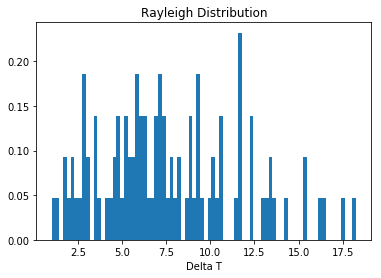

1st Run: Normal


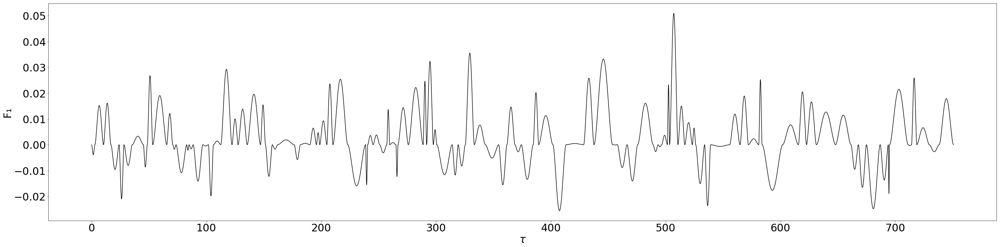

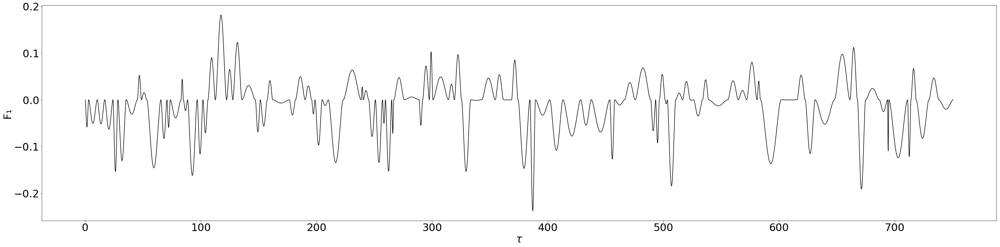

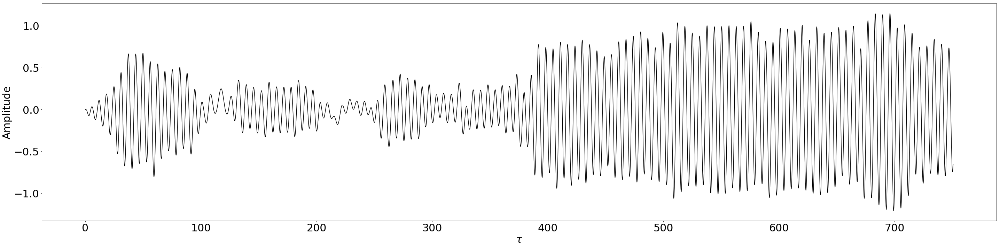

2nd Run: F1 = 0


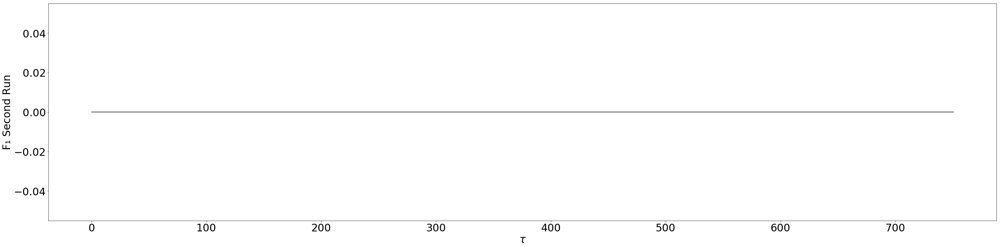

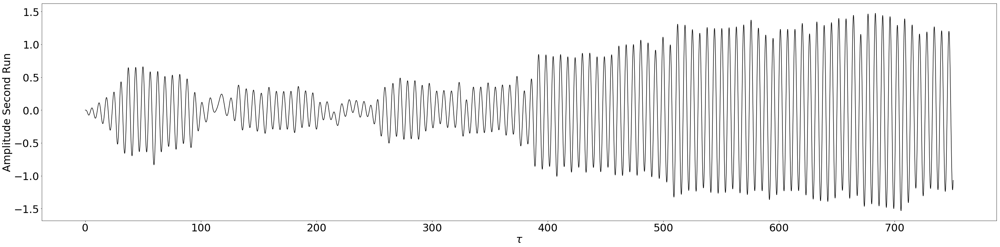

Difference in amplitude of run 1 and 2


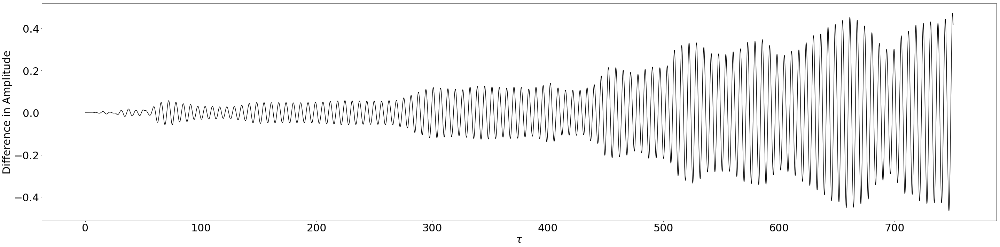



evolution  7


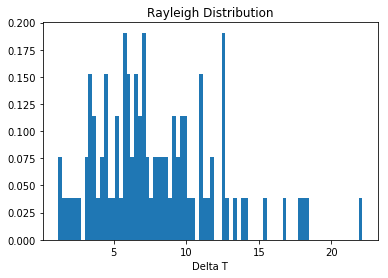

1st Run: Normal


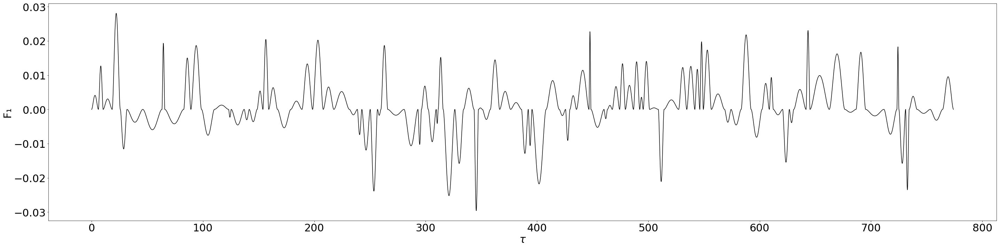

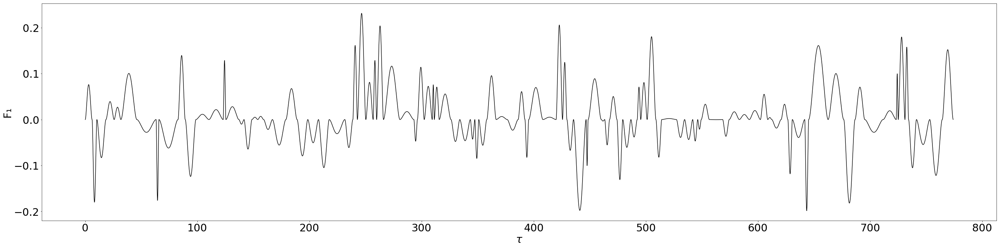

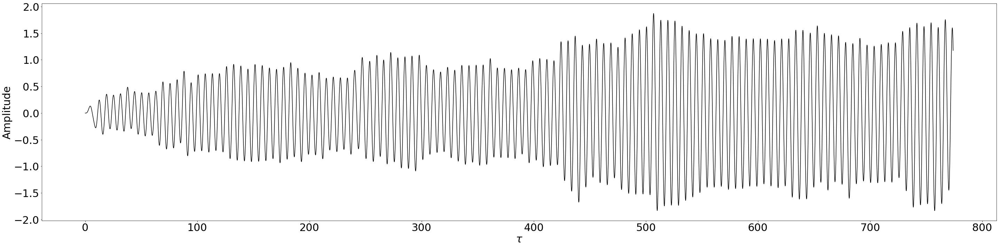

2nd Run: F1 = 0


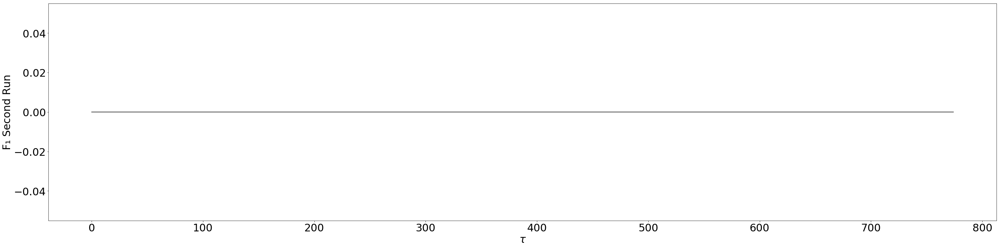

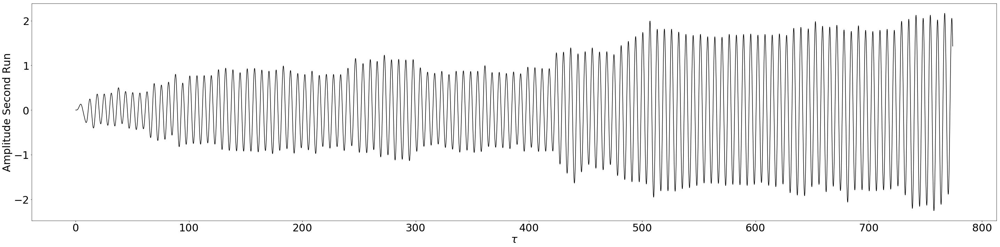

Difference in amplitude of run 1 and 2


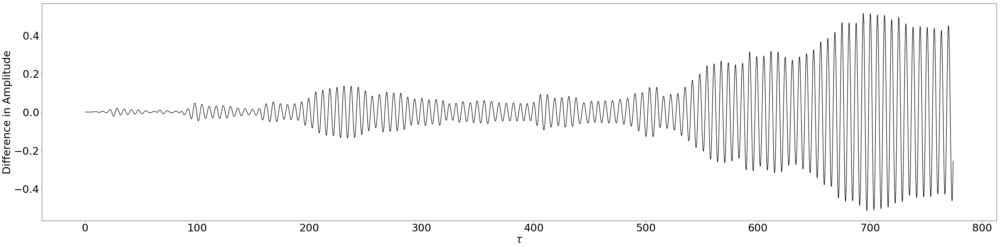



evolution  8


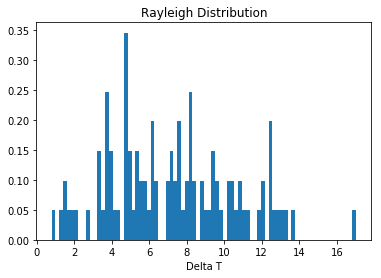

1st Run: Normal


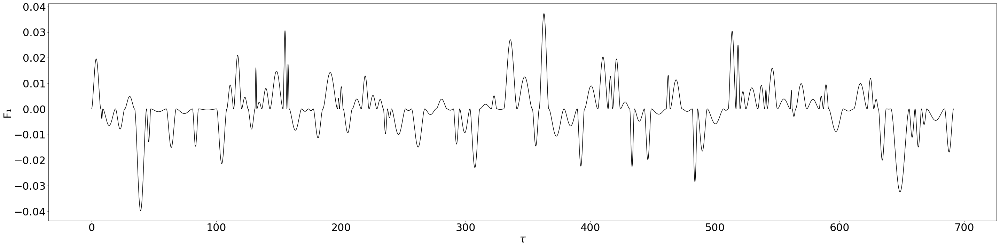

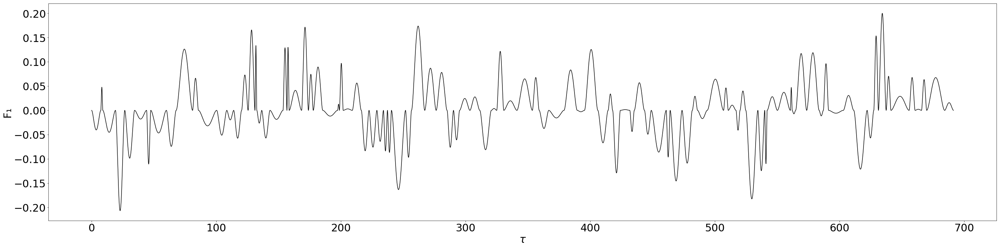

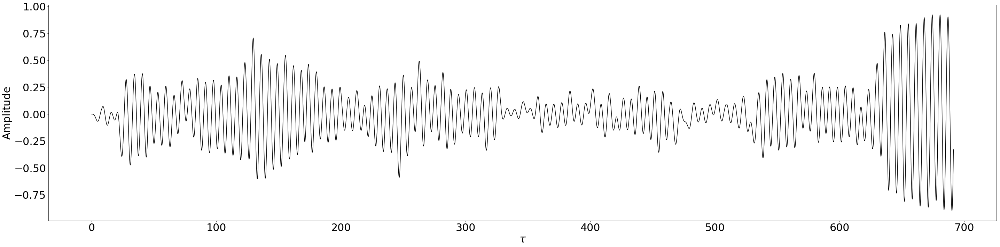

2nd Run: F1 = 0


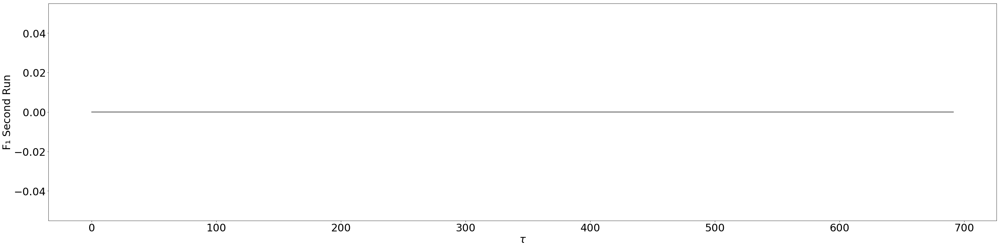

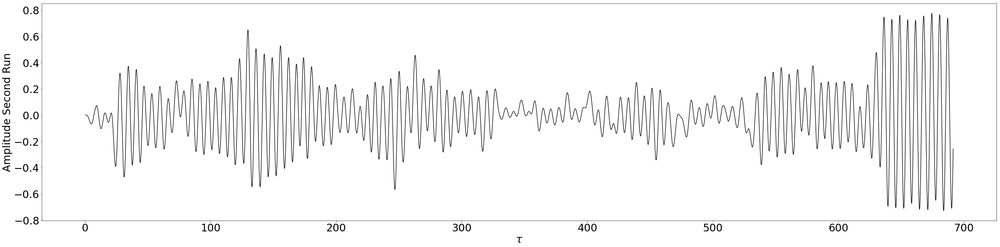

Difference in amplitude of run 1 and 2


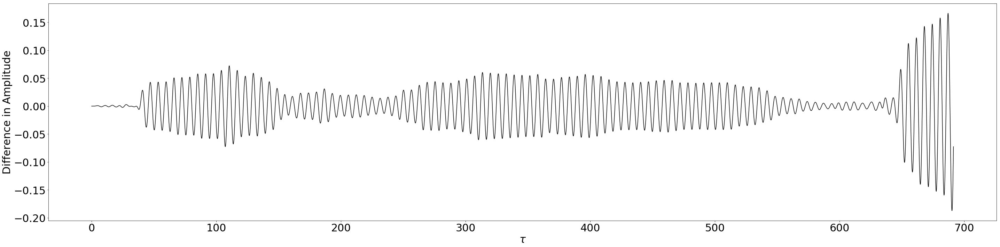



evolution  9


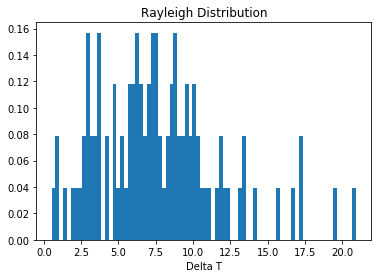

1st Run: Normal


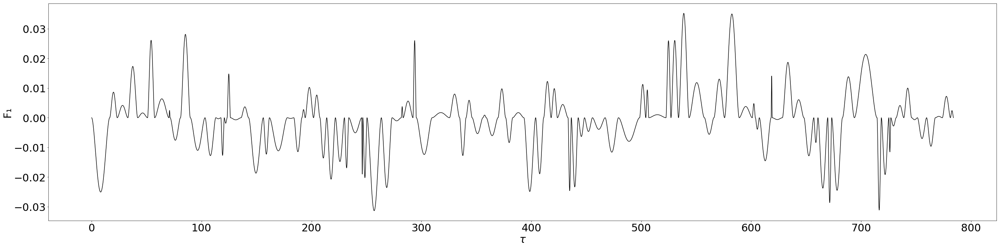

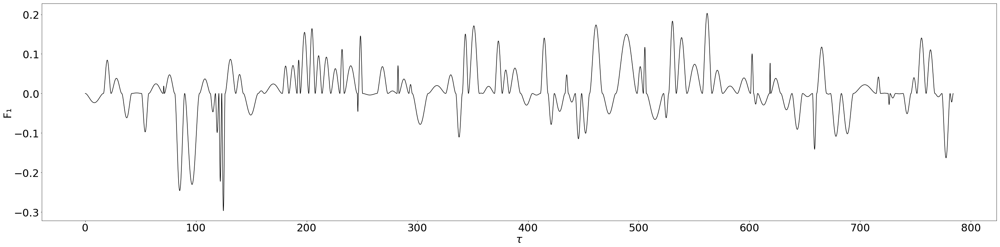

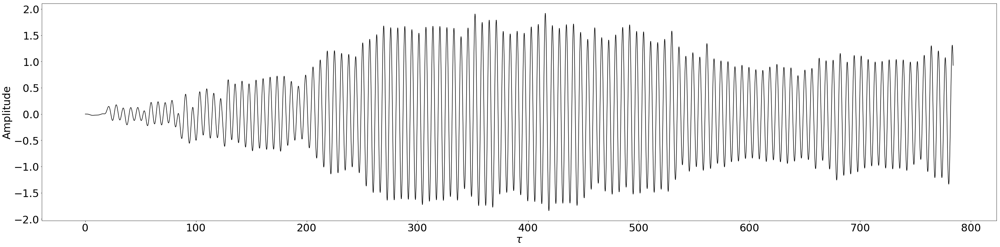

2nd Run: F1 = 0


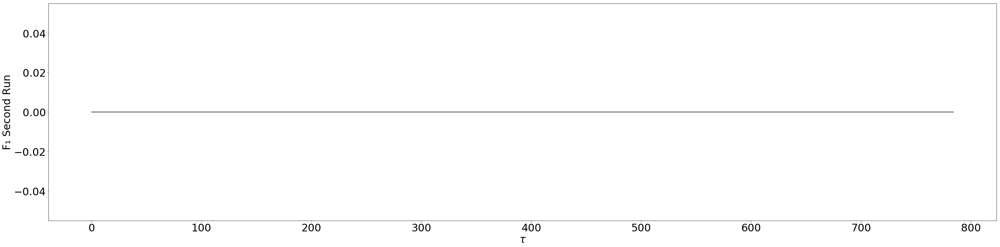

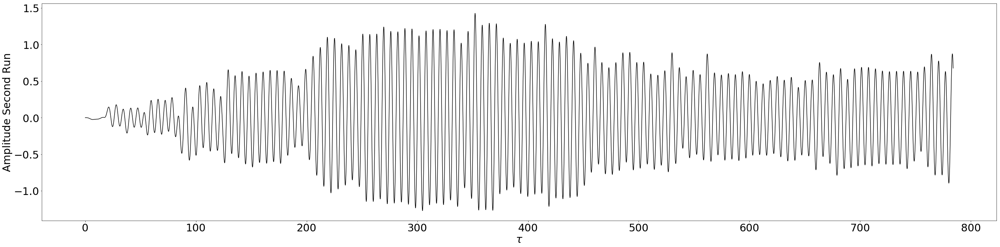

Difference in amplitude of run 1 and 2


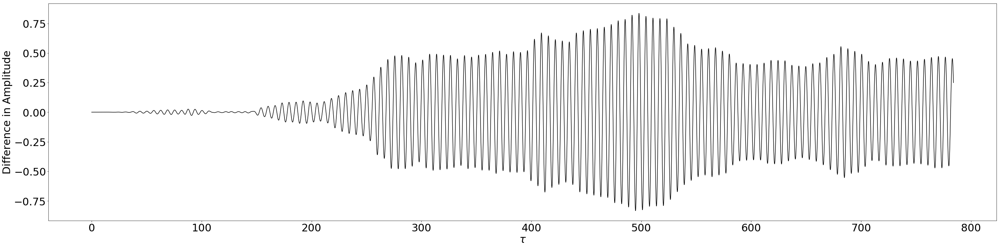



evolution  10


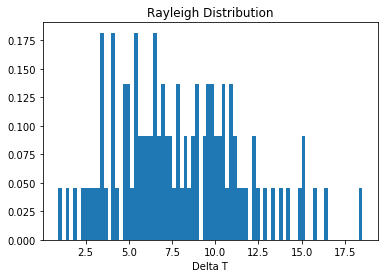

1st Run: Normal


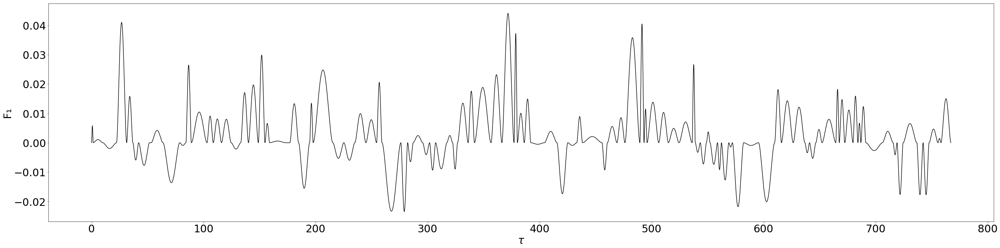

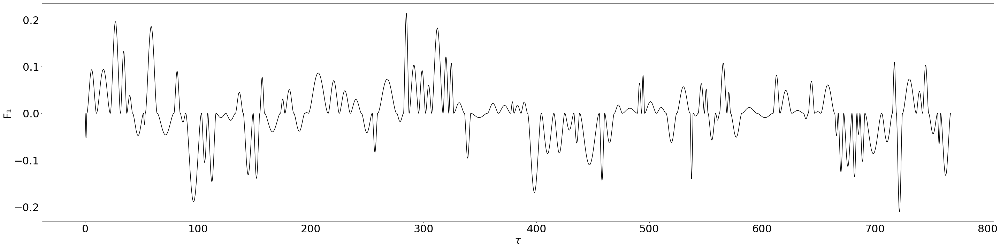

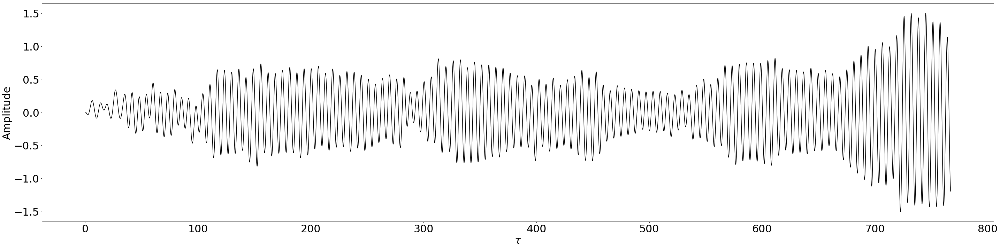

2nd Run: F1 = 0


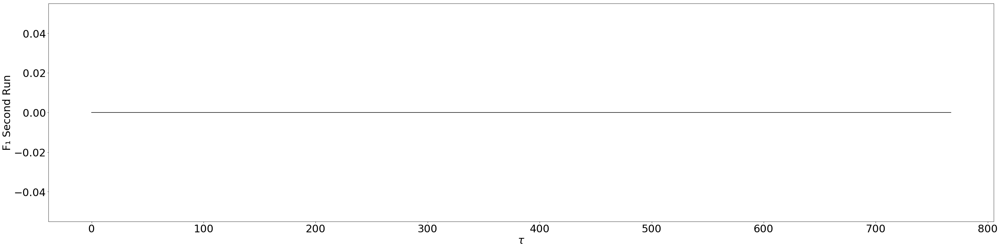

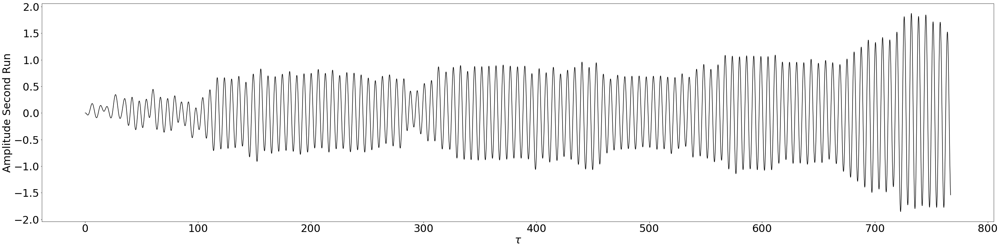

Difference in amplitude of run 1 and 2


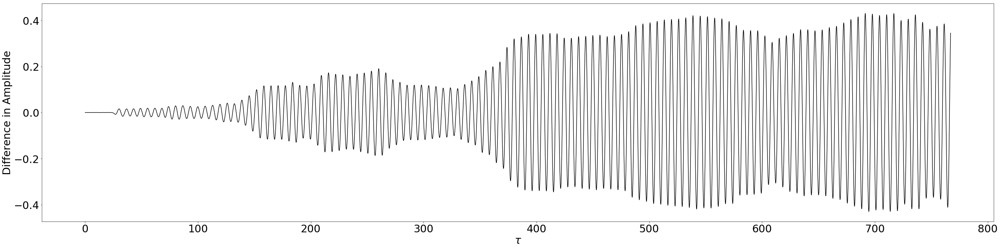

In [11]:
print("evolution 1 above")
print("\n")

# collecting nmax values of alpha from L evolutions
for i in range(L-1):
    
    print("evolution ", i+2)
    
    deltaT = fundeltaT(n_bins, M)
    Tturb, time = funTturb()
    F2, time = funF2()
    F1, time =funF1()
    G1 = funG1(F1)
    F1_2ndRun = funG1(F1)
    Amp=[initial_AT]
    Amp = funAmp(Amp, F1, time)
    Amp_2ndRun = [initial_AT]
    Amp_2ndRun = funAmp(Amp_2ndRun, F1_2ndRun, time)
    total_Amp.append(Amp)
    total_Amp_2ndRun.append(Amp_2ndRun)
    
    print("1st Run: Normal")
    
    plt.figure(figsize=(40,10))    
    plt.plot(time, F1, 'k')
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)
    plt.xlabel(r'$\tau$', **axis_font)
    plt.ylabel('F\u2081', **axis_font)
    plt.tight_layout()
    plt.show()
    
    plt.figure(figsize=(40,10))    
    plt.plot(time, F2, 'k')
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)
    plt.xlabel(r'$\tau$', **axis_font)
    plt.ylabel('F\u2081', **axis_font)
    plt.tight_layout()
    plt.show()
    
    plt.figure(figsize=(40,10))
    plt.plot(time, Amp, 'k')
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)
    plt.xlabel(r'$\tau$', **axis_font)
    plt.ylabel('Amplitude', **axis_font)
    plt.tight_layout()
    plt.show()
    
    print("2nd Run: F1 = 0")
    
    plt.figure(figsize=(40,10))    
    plt.plot(time, F1_2ndRun, 'k')
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)
    plt.xlabel(r'$\tau$', **axis_font)
    plt.ylabel('F\u2081 Second Run', **axis_font)
    plt.tight_layout()
    plt.show()
    
    plt.figure(figsize=(40,10))
    plt.plot(time, Amp_2ndRun, 'k')
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)
    plt.xlabel(r'$\tau$', **axis_font)
    plt.ylabel('Amplitude Second Run', **axis_font)
    plt.tight_layout()
    plt.show()
    
    print("Difference in amplitude of run 1 and 2")
    
    Amp_difference = []

    for i in range(len(Amp)):
        Amp_difference.append(Amp[i] - Amp_2ndRun[i])

    plt.figure(figsize=(40,10))
    plt.plot(time, Amp_difference, 'k')
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)
    plt.xlabel(r'$\tau$', **axis_font)
    plt.ylabel('Difference in Amplitude', **axis_font)
    plt.tight_layout()
    plt.show()
    print("\n")

## Average value of A^2 for all runs

In [12]:
total_Amp = flatten(total_Amp)
Asqr = FunAsqr(total_Amp)
avg = sum(Asqr) / len(Asqr)

total_Amp_2ndRun = flatten(total_Amp_2ndRun)
Asqr_2ndRun = FunAsqr(total_Amp_2ndRun)
avg_2ndRun = sum(Asqr_2ndRun) / len(Asqr_2ndRun)

print("1st Run: Normal")
print("Average of A^2 =", avg)

print("\n")

print("2nd Run: F1 = 0")
print("Average of A^2 =", avg_2ndRun)

1st Run: Normal
Average of A^2 = 0.3698696885485814


2nd Run: F1 = 0
Average of A^2 = 0.3545071948066286
